# Vegan Food Sentiment Analysis

In [1]:
#!pip install tweepy --user

In [2]:
#!pip install nltk --user

In [3]:
import tweepy # Twitter API
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', None)

In [5]:
%run ./keys.ipynb # run the file for getting API Keys

In [6]:
auth = tweepy.OAuthHandler(API_key,API_key_secret) 
auth.set_access_token(Access_token,Access_token_secret)
api = tweepy.API(auth)

In [7]:
CN_lat = 60.36414   # Fort Smith, NT (NorthWest Territories)
CN_long= -123.2145
CN_max_range = 5000
CN = "Canada"

US_lat = 39.8283    # Kansas, USA
US_long= -98.5795
US_max_range = 500
US = "US"


IN_lat = 21.7679    # Bhairopani, Madhya Pradesh, India
IN_long= 78.8718
IN_max_range = 500
IN = "India"


data = []

In [8]:
# get the tweets accrding to country and Vegan food

def get_tweet(lat, long, max_range, loc):
    
    tweet = tweepy.Cursor(api.search_tweets,
                   q=["vegan" or "Vegan" or "VEGAN" and "food", "diet"],
                   geocode = "%f,%f,%dkm" % (lat, long, max_range),
                   lang="en").items(5000)
    for i in tweet:
        data.append([i.created_at, i.id, i.user.screen_name,i.text, i.favorite_count, i.retweet_count, i.lang,
                     i.user.location, loc]) 

In [9]:
get_tweet(CN_lat, CN_long, CN_max_range, CN)
get_tweet(US_lat, US_long, US_max_range, US)
get_tweet(IN_lat, IN_long, IN_max_range, IN)

In [10]:
col = ["Date_and_Time", "Tweet_Id", "User", "Tweet", "Like_Count", "Retweet_Count", "Lang", "Location","Country"]
df = pd.DataFrame(data, columns=col)

In [11]:
df

,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country
0,2022-07-31 18:37:50+00:00,1553812196060274690,KeyWestPsychic,All the food I’m going to be making is from ht...,0,0,en,🇨🇦Canada,Canada
1,2022-07-30 22:07:43+00:00,1553502628000448512,MathieuChiasson,@SBakerMD The guy feed his dog a vegan diet......,0,0,en,Canada,Canada
2,2022-07-30 13:50:54+00:00,1553377596674637824,Mysticienne,@nonbinarybooty Eating a diet of whole plant f...,0,0,en,Canada,Canada
3,2022-07-30 09:04:52+00:00,1553305613769224192,PettyWalrus,I need answers on the McDonald’s thing bc how ...,2,0,en,Canada,Canada
4,2022-07-30 09:00:26+00:00,1553304498390503424,PettyWalrus,At least we’re finally out of the vegan diet e...,0,0,en,Canada,Canada
5,2022-07-30 06:03:15+00:00,1553259909868687361,emj0415,@nonbinarybooty my dad was forced into a vegan...,4,0,en,Canada,Canada
6,2022-07-29 22:44:01+00:00,1553149374020157442,MathieuChiasson,@TheNutrivore @pufadave @LukeLac00913475 The i...,0,0,en,Canada,Canada
7,2022-07-29 19:13:46+00:00,1553096464275894272,manicbookkeeper,@WBrettWilson Most people who follow a plant b...,0,0,en,Canada,Canada
8,2022-07-28 17:01:18+00:00,1552700739058749440,nafsikasgarden,Add our vegan cheddar cheese to your next reci...,0,0,en,Canada,Canada
9,2022-07-26 16:58:59+00:00,1551975378092077056,nafsikasgarden,Taco Tuesday is here! 🌮😋 Enjoy your favourite ...,0,0,en,Canada,Canada


In [12]:
df["User"] = df.User.astype("string")
df["Tweet"] = df.Tweet.astype("string")
df["Lang"] = df.Lang.astype("string")
df["Location"] = df.Location.astype("string")
df["Country"] = df.Country.astype('category') 

In [13]:
df.dtypes

Date_and_Time    datetime64[ns, UTC]
Tweet_Id                       int64
User                          string
Tweet                         string
Like_Count                     int64
Retweet_Count                  int64
Lang                          string
Location                      string
Country                     category
dtype: object

In [14]:
df.Tweet.duplicated().sum()

7

In [15]:
df.drop_duplicates('Tweet', keep='last', inplace=True) # remove duplicate tweets 

In [16]:
df.Tweet.duplicated().sum()

0

In [17]:
dt = datetime.now().strftime("%Y_%m_%d-%H-%M-%S_%p")

In [18]:
dt

'2022_08_03-10-43-42_AM'

In [19]:
df.to_csv(f"C:\\Users\\Neha\\Downloads\\\Vegan\\Data\\vegan_data_{dt}.csv") # to write the data into csv file with date and timestamp

# Data Preprocessing

Data preprocessing steps:

1. Cleaning the text
2. Tokenization
3. Enrichment – POS tagging
4. Stopwords removal
5. Obtaining the Lemma words

## To clean the twitter's tweets

In [20]:
# NLTK Sentiment Analysis Package : https://www.nltk.org/api/nltk.sentiment.html
#The NLTK library contains various utilities that allow you to effectively manipulate and analyze linguistic data.

import nltk # nltk(Natural Language Toolkit) Library to work with human language data

In [21]:
# to download specific resources directly from particular library
# NLTK to find and download each resource based on its identifier


# nltk.download('stopwords') 
# nltk.download('wordnet')

In [22]:
from nltk.corpus import stopwords 
# Wordnet is a lexical database for the English language that helps the script determine the base word. 
import re as re 
# Regular expression Library : Both patterns and strings to be 
#searched can be Unicode strings (str) as well as 8-bit strings (bytes). :: https://docs.python.org/3/library/re.html#module-re
#1. Hyperlinks - All hyperlinks in Twitter are converted to the URL shortener t.co. 
    # Therefore, keeping them in the text processing would not add any value to the analysis.
#2. Twitter handles in replies - These Twitter usernames are preceded by a @ symbol, 
    # which does not convey any meaning.
#3. Punctuation and special characters - While these often provide context to textual data, 
    # this context is often difficult to process. 
    # For simplicity, you will remove all punctuation and special characters from tweets.


# Define a function to clean the text

In [23]:
# Handling the data clean part using below user defined function 
def clean(text):
    text = re.sub("@[A-Za-z0-9_]+","", text) # Removing mentions
    text = re.sub("#[A-Za-z0-9_]+","", text) # Removing hashtags
    text = re.sub(r"http\S+", "", text) # Removing links
    text = re.sub(r"www.\S+", "", text) # Removing links
    text = re.sub('[()!?]', '', text) # Removing punctuations/Special Characters
    text = re.sub('\[.*?\]','', text) # Removing punctuations/Special Characters
    text = re.sub("[^A-Za-z0-9 \t]","", text) # Filtering non-alphanumeric characters if incase something still persists
    text = re.sub("\d+","", text) # Removing digits e.g. 1000x, 100p
    return text

In [24]:
# Cleaning the text in the review column

df['Cleaned_Tweets'] = df['Tweet'].apply(clean) 

In [25]:
df['Cleaned_Tweets'] = df['Cleaned_Tweets'].apply(lambda x: ','.join([w for w in x.split() if len(w)>3]))

In [26]:
df["Cleaned_Tweets"]

0      food,going,making,from,fitness,people,that,pos...
1      feed,vegan,diet,actually,ethical,vegan,disguis...
2      Eating,diet,whole,plant,foods,been,historicall...
3      need,answers,McDonalds,thing,from,vegan,diet,p...
4      least,were,finally,vegan,diet,more,fear,anothe...
5      forced,into,vegan,diet,heart,just,thankful,veg...
6          implied,nutritional,hole,from,pure,vegan,diet
7      Most,people,follow,plant,based,diet,read,label...
8      vegan,cheddar,cheese,your,next,recipe,experien...
9      Taco,Tuesday,here,Enjoy,your,favourite,tacos,w...
10     Trump,aborts,plans,initiate,NHSTA,review,autop...
11     plantbased,diet,could,your,answer,healthier,ha...
12     Other,vegans,told,that,they,would,feel,weak,ha...
13       Yeah,thinking,person,washing,floors,their,fault
14     Funny,thing,ismy,diet,mostly,vegetarianwhich,c...
15     used,live,David,Camerons,house,simply,insisted...
16                      vegan,diet,diet,definitely,being
17     your,vulgar,mouth,want,p

In [27]:
# Finding the white space row from dataframe and replacing it with NaN values

df["Cleaned_Tweets"] = df["Cleaned_Tweets"].apply(lambda x: np.nan if (re.search("^\s*$", x)) else x)

In [28]:
# convert into lower case
df["Cleaned_Tweets"] = df["Cleaned_Tweets"].str.lower()

In [29]:
df.isnull().sum()

Date_and_Time     0
Tweet_Id          0
User              0
Tweet             0
Like_Count        0
Retweet_Count     0
Lang              0
Location          0
Country           0
Cleaned_Tweets    1
dtype: int64

In [30]:
df[["Cleaned_Tweets", "Tweet"]]

,Cleaned_Tweets,Tweet
0,"food,going,making,from,fitness,people,that,pos...",All the food I’m going to be making is from ht...
1,"feed,vegan,diet,actually,ethical,vegan,disguis...",@SBakerMD The guy feed his dog a vegan diet......
2,"eating,diet,whole,plant,foods,been,historicall...",@nonbinarybooty Eating a diet of whole plant f...
3,"need,answers,mcdonalds,thing,from,vegan,diet,p...",I need answers on the McDonald’s thing bc how ...
4,"least,were,finally,vegan,diet,more,fear,anothe...",At least we’re finally out of the vegan diet e...
5,"forced,into,vegan,diet,heart,just,thankful,veg...",@nonbinarybooty my dad was forced into a vegan...
6,"implied,nutritional,hole,from,pure,vegan,diet",@TheNutrivore @pufadave @LukeLac00913475 The i...
7,"most,people,follow,plant,based,diet,read,label...",@WBrettWilson Most people who follow a plant b...
8,"vegan,cheddar,cheese,your,next,recipe,experien...",Add our vegan cheddar cheese to your next reci...
9,"taco,tuesday,here,enjoy,your,favourite,tacos,w...",Taco Tuesday is here! 🌮😋 Enjoy your favourite ...


In [31]:
df.dropna(inplace = True) # Dropping the na values

In [32]:
df.reset_index() # Reindexing the dataframe

,index,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country,Cleaned_Tweets
0,0,2022-07-31 18:37:50+00:00,1553812196060274690,KeyWestPsychic,All the food I’m going to be making is from ht...,0,0,en,🇨🇦Canada,Canada,"food,going,making,from,fitness,people,that,pos..."
1,1,2022-07-30 22:07:43+00:00,1553502628000448512,MathieuChiasson,@SBakerMD The guy feed his dog a vegan diet......,0,0,en,Canada,Canada,"feed,vegan,diet,actually,ethical,vegan,disguis..."
2,2,2022-07-30 13:50:54+00:00,1553377596674637824,Mysticienne,@nonbinarybooty Eating a diet of whole plant f...,0,0,en,Canada,Canada,"eating,diet,whole,plant,foods,been,historicall..."
3,3,2022-07-30 09:04:52+00:00,1553305613769224192,PettyWalrus,I need answers on the McDonald’s thing bc how ...,2,0,en,Canada,Canada,"need,answers,mcdonalds,thing,from,vegan,diet,p..."
4,4,2022-07-30 09:00:26+00:00,1553304498390503424,PettyWalrus,At least we’re finally out of the vegan diet e...,0,0,en,Canada,Canada,"least,were,finally,vegan,diet,more,fear,anothe..."
5,5,2022-07-30 06:03:15+00:00,1553259909868687361,emj0415,@nonbinarybooty my dad was forced into a vegan...,4,0,en,Canada,Canada,"forced,into,vegan,diet,heart,just,thankful,veg..."
6,6,2022-07-29 22:44:01+00:00,1553149374020157442,MathieuChiasson,@TheNutrivore @pufadave @LukeLac00913475 The i...,0,0,en,Canada,Canada,"implied,nutritional,hole,from,pure,vegan,diet"
7,7,2022-07-29 19:13:46+00:00,1553096464275894272,manicbookkeeper,@WBrettWilson Most people who follow a plant b...,0,0,en,Canada,Canada,"most,people,follow,plant,based,diet,read,label..."
8,8,2022-07-28 17:01:18+00:00,1552700739058749440,nafsikasgarden,Add our vegan cheddar cheese to your next reci...,0,0,en,Canada,Canada,"vegan,cheddar,cheese,your,next,recipe,experien..."
9,9,2022-07-26 16:58:59+00:00,1551975378092077056,nafsikasgarden,Taco Tuesday is here! 🌮😋 Enjoy your favourite ...,0,0,en,Canada,Canada,"taco,tuesday,here,enjoy,your,favourite,tacos,w..."


In [33]:
df = df.reset_index(drop=True) # Dropping the reindexing column

In [34]:
df.isnull().sum()

Date_and_Time     0
Tweet_Id          0
User              0
Tweet             0
Like_Count        0
Retweet_Count     0
Lang              0
Location          0
Country           0
Cleaned_Tweets    0
dtype: int64

In [35]:
df[["Tweet", "Cleaned_Tweets"]]

,Tweet,Cleaned_Tweets
0,All the food I’m going to be making is from ht...,"food,going,making,from,fitness,people,that,pos..."
1,@SBakerMD The guy feed his dog a vegan diet......,"feed,vegan,diet,actually,ethical,vegan,disguis..."
2,@nonbinarybooty Eating a diet of whole plant f...,"eating,diet,whole,plant,foods,been,historicall..."
3,I need answers on the McDonald’s thing bc how ...,"need,answers,mcdonalds,thing,from,vegan,diet,p..."
4,At least we’re finally out of the vegan diet e...,"least,were,finally,vegan,diet,more,fear,anothe..."
5,@nonbinarybooty my dad was forced into a vegan...,"forced,into,vegan,diet,heart,just,thankful,veg..."
6,@TheNutrivore @pufadave @LukeLac00913475 The i...,"implied,nutritional,hole,from,pure,vegan,diet"
7,@WBrettWilson Most people who follow a plant b...,"most,people,follow,plant,based,diet,read,label..."
8,Add our vegan cheddar cheese to your next reci...,"vegan,cheddar,cheese,your,next,recipe,experien..."
9,Taco Tuesday is here! 🌮😋 Enjoy your favourite ...,"taco,tuesday,here,enjoy,your,favourite,tacos,w..."


## Tokenization

Splitting strings into smaller parts called tokens.

A token is a sequence of characters in text that serves as a unit. Based on how you create the tokens, they may consist of words, emoticons, hashtags, links, or even individual characters.

A basic way of breaking language into tokens is by splitting the text based on whitespace and punctuation.

In [36]:
from nltk.tokenize import word_tokenize

In [37]:
df["Cleaned_Tweets"]

clean_tweets = df["Cleaned_Tweets"]

tokens = word_tokenize(clean_tweets[0])

tokens

tweet_count = df["Cleaned_Tweets"].count()

tweet_count

169

## POS tagging

POS (Part of Speech) : Used to tagging parts of speech to each word of a given text such as nouns, verb, pronouns, adverbs based on definitation and its context.

In [38]:
from nltk.tag import pos_tag

pos = nltk.pos_tag(tokens)

pos

[('food', 'NN'),
 (',', ','),
 ('going', 'VBG'),
 (',', ','),
 ('making', 'VBG'),
 (',', ','),
 ('from', 'IN'),
 (',', ','),
 ('fitness', 'NN'),
 (',', ','),
 ('people', 'NNS'),
 (',', ','),
 ('that', 'IN'),
 (',', ','),
 ('post', 'NN'),
 (',', ','),
 ('recipes', 'NNS')]

## Stopwords removal


    NNP: Noun, proper, singular
    NN: Noun, common, singular or mass
    IN: Preposition or conjunction, subordinating
    VBG: Verb, gerund or present participle
    VBN: Verb, past participle


In [39]:
# nltk.download('omw-1.4')

In [40]:
from nltk.corpus import wordnet

In [41]:
print(stopwords.words('english')) # display the stopwords in the English language.

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [42]:
#nltk.download('tagsets')
#nltk.help.upenn_tagset()

In [43]:
# POS tagger dictionary with whole dataset

pos_dict = {'J':wordnet.ADJ, 'V':wordnet.VERB, 'N':wordnet.NOUN, 'R':wordnet.ADV}
def token_stop_pos(text):  
    
# token_stop_pos is the function that takes the text and performs tokenization, removes stopwords, 
# and tags the words to their POS.

    tags = pos_tag(word_tokenize(text))
    newlist = []
    
    for word, tag in tags:
        if word.lower() not in set(stopwords.words('english')):
            newlist.append(tuple([word, pos_dict.get(tag[0])]))
    return newlist

In [44]:
df['POS_tagged'] = df["Cleaned_Tweets"].apply(token_stop_pos)

In [45]:
df['POS_tagged']

0      [(food, n), (,, None), (going, v), (,, None), ...
1      [(feed, n), (,, None), (vegan, n), (,, None), ...
2      [(eating, n), (,, None), (diet, a), (,, None),...
3      [(need, n), (,, None), (answers, n), (,, None)...
4      [(least, a), (,, None), (,, None), (finally, r...
5      [(forced, v), (,, None), (,, None), (vegan, No...
6      [(implied, v), (,, None), (nutritional, a), (,...
7      [(,, None), (people, n), (,, None), (follow, v...
8      [(vegan, n), (,, None), (cheddar, n), (,, None...
9      [(taco, n), (,, None), (tuesday, n), (,, None)...
10     [(trump, n), (,, None), (aborts, n), (,, None)...
11     [(plantbased, v), (,, None), (diet, a), (,, No...
12     [(,, None), (vegans, n), (,, None), (told, v),...
13     [(yeah, n), (,, None), (thinking, n), (,, None...
14     [(funny, r), (,, None), (thing, n), (,, None),...
15     [(used, v), (,, None), (live, a), (,, None), (...
16     [(vegan, n), (,, None), (diet, a), (,, None), ...
17     [(,, None), (vulgar, n),

## Obtaining the Lemmatize words

In [46]:
from nltk.stem import WordNetLemmatizer

In [47]:
# Lemmatization which helps in breaking down words from plural to a singular form.
wordnet_lemmatizer = WordNetLemmatizer()

# lemmatize is a function that takes pos_tag tuples, and gives the Lemma for each word in pos_tag based on 
#the pos of that word. We applied it to the ‘POS tagged’ column and created a column ‘Lemma’ to store the output.

def lemmatize(pos_data):
    lemma_rew = " "
    for word, pos in pos_data:
        if not pos:
            lemma = word
            lemma_rew = lemma_rew + " " + lemma
        else:
            lemma = wordnet_lemmatizer.lemmatize(word, pos=pos)
            lemma_rew = lemma_rew + " " + lemma
    return lemma_rew

In [48]:
df['Lemma'] = df["POS_tagged"].apply(lemmatize)
df["Lemma"]=df.Lemma.str.replace(",", "")

In [49]:
df[["POS_tagged", 'Lemma']]

,POS_tagged,Lemma
0,"[(food, n), (,, None), (going, v), (,, None), ...",food go make fitness people post recipe
1,"[(feed, n), (,, None), (vegan, n), (,, None), ...",feed vegan diet actually ethical vegan ...
2,"[(eating, n), (,, None), (diet, a), (,, None),...",eating diet whole plant food historica...
3,"[(need, n), (,, None), (answers, n), (,, None)...",need answer mcdonalds thing vegan diet...
4,"[(least, a), (,, None), (,, None), (finally, r...",least finally vegan diet fear another...
5,"[(forced, v), (,, None), (,, None), (vegan, No...",force vegan diet heart thankful vegan...
6,"[(implied, v), (,, None), (nutritional, a), (,...",imply nutritional hole pure vegan diet
7,"[(,, None), (people, n), (,, None), (follow, v...",people follow plant base diet read la...
8,"[(vegan, n), (,, None), (cheddar, n), (,, None...",vegan cheddar cheese next recipe exper...
9,"[(taco, n), (,, None), (tuesday, n), (,, None)...",taco tuesday enjoy favourite taco ve...


## Compare the text

In [50]:
df[['Cleaned_Tweets', 'Lemma']]

,Cleaned_Tweets,Lemma
0,"food,going,making,from,fitness,people,that,pos...",food go make fitness people post recipe
1,"feed,vegan,diet,actually,ethical,vegan,disguis...",feed vegan diet actually ethical vegan ...
2,"eating,diet,whole,plant,foods,been,historicall...",eating diet whole plant food historica...
3,"need,answers,mcdonalds,thing,from,vegan,diet,p...",need answer mcdonalds thing vegan diet...
4,"least,were,finally,vegan,diet,more,fear,anothe...",least finally vegan diet fear another...
5,"forced,into,vegan,diet,heart,just,thankful,veg...",force vegan diet heart thankful vegan...
6,"implied,nutritional,hole,from,pure,vegan,diet",imply nutritional hole pure vegan diet
7,"most,people,follow,plant,based,diet,read,label...",people follow plant base diet read la...
8,"vegan,cheddar,cheese,your,next,recipe,experien...",vegan cheddar cheese next recipe exper...
9,"taco,tuesday,here,enjoy,your,favourite,tacos,w...",taco tuesday enjoy favourite taco ve...


In [51]:
stop_word = stopwords.words('english')
stop_word

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [52]:
newStopWords = ['cant','couldnt', 'doesnt', 'aint', 'dont', 'shouldve', 'arent', 'didnt', "hadnt", 'hasnt', 'havent', 'isnt'
               , 'mightnt', 'mustnt', 'neednt', 'shant', 'shouldnt', 'wasnt', 'werent', 'wont', 'wouldnt', 'would', 'amp'
                , 'im', 'enou', 'governme', 'governmen', 'mill', 'ther', 'theyre', 'whats', 'availab', 'depr', 'caus', 'amla', 
               'andi', 'bruh', 'chelsea', 'chris', 'cond', 'djokovic', 'greger', 'gtgtgtgt', 'hailey', 'moregtgtgt', 
                'okinawan', 'paul', 'wfpb', 'williams', 'Drs Kim', 'interview Drs', 'Drs', 'Miss Vital', 'Kim Williams', 
                'Kim', 'Im', 'Esselstn', 'Caldwell Esselstn', 'Add COOKBOOK', 'COOKBOOK', 'Williams amp',
                 'Esselstyn', 'U', 'Schwarzenegger', 'ID', '1', 'hey', 'ur', 'CE', 'yo', 'ImmigrationUnafforadble', 
                'iodi', 'accom', 'youll', 'youre', 'martin', 'Liz', 'wmy', 'GFketovegan',  'V s', 'oh', 'Boris', 'captain',
                'Ive', 'hey', 'fo', 'Johnson', 'Ackerberg', 'jackie', 'W', 'g', 'Dr', 'lena', 'pillar', 'via'
                , 'Baldwin',  'bc', 'could', 'shes', 'yeah', 'retweets', 'london', 'crackersjoin', 'also']

In [53]:
stop_word.extend(newStopWords)

In [54]:
df["Lemma"] = df["Lemma"].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_word)]))

In [55]:
df["Lemma"]

0                food go make fitness people post recipe
1      feed vegan diet actually ethical vegan disguis...
2      eating diet whole plant food historically know...
3      need answer mcdonalds thing vegan diet promo m...
4      least finally vegan diet fear another curse event
5      force vegan diet heart thankful vegan drive aware
6                 imply nutritional hole pure vegan diet
7      people follow plant base diet read label state...
8      vegan cheddar cheese next recipe experience de...
9      taco tuesday enjoy favourite taco vegan cheese...
10     trump abort plan initiate nhsta review autopil...
11             plantbased diet answer healthy happy life
12          vegan tell feel weak iron hair fall eat meat
13                      thinking person wash floor fault
14     funny thing ismy diet mostly vegetarianwhich c...
15     use live david camerons house simply insist te...
16                            vegan diet diet definitely
17        vulgar mouth want pic

In [56]:
df.to_csv(f"C:\\Users\\Neha\\Downloads\\\Vegan\\Clean Data\\vegan_data_Clean_{dt}.csv") # to write the data into csv file with date and timestamp

# 

## Sentiment Analysis

# Vader (Valence Aware Dictionary and Sentiment Reasoner)

NLTK already has a built-in, pretrained sentiment analyzer called VADER (Valence Aware Dictionary and Sentiment Reasoner).

However, VADER is best suited for language used in social media, like short sentences with some slang and abbreviations.

It's a Rule-based Model for Sentiment Analysis of Social Media Text.

This analyzer calculates text sentiment and produces four different classes of output 
scores: positive, negative, neutral, and compound.

https://pypi.org/project/vaderSentiment/

A compound score is the aggregate of the score of a word, or precisely, the sum of all words in the lexicon, normalized between -1 and 1. 


Positive sentiment: compound score >= 0.05

Neutral sentiment: (compound score > -0.05) and (compound score < 0.05)

Negative sentiment: compound score <= -0.05

Compound Score: The compound score is computed by summing the valence scores of each word in the lexicon, adjusted according to the rules, and then normalized to be between -1 (most extreme negative) and +1 (most extreme positive).


# 

In [57]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [58]:
negative = []
neutral = []
positive = []
compound = []

In [59]:
senti = SentimentIntensityAnalyzer()

In [60]:
for i in df.index:
    scores = senti.polarity_scores(df['Tweet'].iloc[i])
    negative.append(scores['neg'])
    neutral.append(scores['neu'])
    positive.append(scores['pos'])
    compound.append(scores['compound'])

In [61]:
df['Negative'] = negative
df['Neutral'] = neutral
df['Positive'] = positive
df['Compound'] = compound

In [62]:
# using where function of numpy library to evaluate and assign the constructive/actual values/Sentimental value
df["Opinion"] = np.where(df["Compound"] >= 0.05, 'Positive', 
                         np.where(df["Compound"] <= -0.05, "Negative", "Neutral"))

In [63]:
df["Opinion_Weight"] = np.where(df["Compound"] >= 0.05, 1.0, 
                         np.where(df["Compound"] <= -0.05, -1.0, 0.0))

In [64]:
df.index

RangeIndex(start=0, stop=169, step=1)

In [65]:
df

,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country,Cleaned_Tweets,POS_tagged,Lemma,Negative,Neutral,Positive,Compound,Opinion,Opinion_Weight
0,2022-07-31 18:37:50+00:00,1553812196060274690,KeyWestPsychic,All the food I’m going to be making is from ht...,0,0,en,🇨🇦Canada,Canada,"food,going,making,from,fitness,people,that,pos...","[(food, n), (,, None), (going, v), (,, None), ...",food go make fitness people post recipe,0.000,0.900,0.100,0.2732,Positive,1.0
1,2022-07-30 22:07:43+00:00,1553502628000448512,MathieuChiasson,@SBakerMD The guy feed his dog a vegan diet......,0,0,en,Canada,Canada,"feed,vegan,diet,actually,ethical,vegan,disguis...","[(feed, n), (,, None), (vegan, n), (,, None), ...",feed vegan diet actually ethical vegan disguis...,0.086,0.779,0.135,0.2960,Positive,1.0
2,2022-07-30 13:50:54+00:00,1553377596674637824,Mysticienne,@nonbinarybooty Eating a diet of whole plant f...,0,0,en,Canada,Canada,"eating,diet,whole,plant,foods,been,historicall...","[(eating, n), (,, None), (diet, a), (,, None),...",eating diet whole plant food historically know...,0.000,1.000,0.000,0.0000,Neutral,0.0
3,2022-07-30 09:04:52+00:00,1553305613769224192,PettyWalrus,I need answers on the McDonald’s thing bc how ...,2,0,en,Canada,Canada,"need,answers,mcdonalds,thing,from,vegan,diet,p...","[(need, n), (,, None), (answers, n), (,, None)...",need answer mcdonalds thing vegan diet promo m...,0.000,1.000,0.000,0.0000,Neutral,0.0
4,2022-07-30 09:00:26+00:00,1553304498390503424,PettyWalrus,At least we’re finally out of the vegan diet e...,0,0,en,Canada,Canada,"least,were,finally,vegan,diet,more,fear,anothe...","[(least, a), (,, None), (,, None), (finally, r...",least finally vegan diet fear another curse event,0.251,0.749,0.000,-0.6901,Negative,-1.0
5,2022-07-30 06:03:15+00:00,1553259909868687361,emj0415,@nonbinarybooty my dad was forced into a vegan...,4,0,en,Canada,Canada,"forced,into,vegan,diet,heart,just,thankful,veg...","[(forced, v), (,, None), (,, None), (vegan, No...",force vegan diet heart thankful vegan drive aware,0.112,0.711,0.177,0.4101,Positive,1.0
6,2022-07-29 22:44:01+00:00,1553149374020157442,MathieuChiasson,@TheNutrivore @pufadave @LukeLac00913475 The i...,0,0,en,Canada,Canada,"implied,nutritional,hole,from,pure,vegan,diet","[(implied, v), (,, None), (nutritional, a), (,...",imply nutritional hole pure vegan diet,0.000,1.000,0.000,0.0000,Neutral,0.0
7,2022-07-29 19:13:46+00:00,1553096464275894272,manicbookkeeper,@WBrettWilson Most people who follow a plant b...,0,0,en,Canada,Canada,"most,people,follow,plant,based,diet,read,label...","[(,, None), (people, n), (,, None), (follow, v...",people follow plant base diet read label state...,0.000,0.859,0.141,0.4215,Positive,1.0
8,2022-07-28 17:01:18+00:00,1552700739058749440,nafsikasgarden,Add our vegan cheddar cheese to your next reci...,0,0,en,Canada,Canada,"vegan,cheddar,cheese,your,next,recipe,experien...","[(vegan, n), (,, None), (cheddar, n), (,, None...",vegan cheddar cheese next recipe experience de...,0.000,0.829,0.171,0.4753,Positive,1.0
9,2022-07-26 16:58:59+00:00,1551975378092077056,nafsikasgarden,Taco Tuesday is here! 🌮😋 Enjoy your favourite ...,0,0,en,Canada,Canada,"taco,tuesday,here,enjoy,your,favourite,tacos,w...","[(taco, n), (,, None), (tuesday, n), (,, None)...",taco tuesday enjoy favourite taco vegan cheese...,0.000,0.845,0.155,0.5411,Positive,1.0


In [66]:
df[["Lemma", 'Negative', 'Neutral', 'Positive', 'Compound', 'Opinion', 'Opinion_Weight']]

,Lemma,Negative,Neutral,Positive,Compound,Opinion,Opinion_Weight
0,food go make fitness people post recipe,0.000,0.900,0.100,0.2732,Positive,1.0
1,feed vegan diet actually ethical vegan disguis...,0.086,0.779,0.135,0.2960,Positive,1.0
2,eating diet whole plant food historically know...,0.000,1.000,0.000,0.0000,Neutral,0.0
3,need answer mcdonalds thing vegan diet promo m...,0.000,1.000,0.000,0.0000,Neutral,0.0
4,least finally vegan diet fear another curse event,0.251,0.749,0.000,-0.6901,Negative,-1.0
5,force vegan diet heart thankful vegan drive aware,0.112,0.711,0.177,0.4101,Positive,1.0
6,imply nutritional hole pure vegan diet,0.000,1.000,0.000,0.0000,Neutral,0.0
7,people follow plant base diet read label state...,0.000,0.859,0.141,0.4215,Positive,1.0
8,vegan cheddar cheese next recipe experience de...,0.000,0.829,0.171,0.4753,Positive,1.0
9,taco tuesday enjoy favourite taco vegan cheese...,0.000,0.845,0.155,0.5411,Positive,1.0


In [67]:
posi = df[df["Opinion"] == "Positive"]

In [68]:
posi

,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country,Cleaned_Tweets,POS_tagged,Lemma,Negative,Neutral,Positive,Compound,Opinion,Opinion_Weight
0,2022-07-31 18:37:50+00:00,1553812196060274690,KeyWestPsychic,All the food I’m going to be making is from ht...,0,0,en,🇨🇦Canada,Canada,"food,going,making,from,fitness,people,that,pos...","[(food, n), (,, None), (going, v), (,, None), ...",food go make fitness people post recipe,0.000,0.900,0.100,0.2732,Positive,1.0
1,2022-07-30 22:07:43+00:00,1553502628000448512,MathieuChiasson,@SBakerMD The guy feed his dog a vegan diet......,0,0,en,Canada,Canada,"feed,vegan,diet,actually,ethical,vegan,disguis...","[(feed, n), (,, None), (vegan, n), (,, None), ...",feed vegan diet actually ethical vegan disguis...,0.086,0.779,0.135,0.2960,Positive,1.0
5,2022-07-30 06:03:15+00:00,1553259909868687361,emj0415,@nonbinarybooty my dad was forced into a vegan...,4,0,en,Canada,Canada,"forced,into,vegan,diet,heart,just,thankful,veg...","[(forced, v), (,, None), (,, None), (vegan, No...",force vegan diet heart thankful vegan drive aware,0.112,0.711,0.177,0.4101,Positive,1.0
7,2022-07-29 19:13:46+00:00,1553096464275894272,manicbookkeeper,@WBrettWilson Most people who follow a plant b...,0,0,en,Canada,Canada,"most,people,follow,plant,based,diet,read,label...","[(,, None), (people, n), (,, None), (follow, v...",people follow plant base diet read label state...,0.000,0.859,0.141,0.4215,Positive,1.0
8,2022-07-28 17:01:18+00:00,1552700739058749440,nafsikasgarden,Add our vegan cheddar cheese to your next reci...,0,0,en,Canada,Canada,"vegan,cheddar,cheese,your,next,recipe,experien...","[(vegan, n), (,, None), (cheddar, n), (,, None...",vegan cheddar cheese next recipe experience de...,0.000,0.829,0.171,0.4753,Positive,1.0
9,2022-07-26 16:58:59+00:00,1551975378092077056,nafsikasgarden,Taco Tuesday is here! 🌮😋 Enjoy your favourite ...,0,0,en,Canada,Canada,"taco,tuesday,here,enjoy,your,favourite,tacos,w...","[(taco, n), (,, None), (tuesday, n), (,, None)...",taco tuesday enjoy favourite taco vegan cheese...,0.000,0.845,0.155,0.5411,Positive,1.0
11,2022-07-26 02:36:10+00:00,1551758244074356736,healthstepsonly,Why a plant-based diet could be your answer to...,0,0,en,Canada,Canada,"plantbased,diet,could,your,answer,healthier,ha...","[(plantbased, v), (,, None), (diet, a), (,, No...",plantbased diet answer healthy happy life,0.000,0.815,0.185,0.5267,Positive,1.0
13,2022-07-24 19:11:15+00:00,1551283889502425089,LibertasIustis,@captainpylon @DavidBellamyUK Yeah but I'm thi...,0,0,en,Canada,Canada,"yeah,thinking,person,washing,floors,their,fault","[(yeah, n), (,, None), (thinking, n), (,, None...",thinking person wash floor fault,0.000,0.800,0.200,0.5403,Positive,1.0
14,2022-08-03 12:23:23+00:00,1554805127189594113,kittendrawers,@SkeloGlizzy @Wes_Talley @MetroUK Funny thing ...,1,0,en,United States,US,"funny,thing,ismy,diet,mostly,vegetarianwhich,c...","[(funny, r), (,, None), (thing, n), (,, None),...",funny thing ismy diet mostly vegetarianwhich c...,0.000,0.704,0.296,0.7089,Positive,1.0
16,2022-08-03 07:15:22+00:00,1554727609753169920,Grown_Simba27,@murujUP @Cbo78 @OLarsenB @ZubyMusic @NBCNews ...,0,0,en,DENVER CO,US,"vegan,diet,diet,definitely,being","[(vegan, n), (,, None), (diet, a), (,, None), ...",vegan diet diet definitely,0.000,0.870,0.130,0.4549,Positive,1.0


In [69]:
negi = df[df["Opinion"] == "Negative"]

In [70]:
negi

,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country,Cleaned_Tweets,POS_tagged,Lemma,Negative,Neutral,Positive,Compound,Opinion,Opinion_Weight
4,2022-07-30 09:00:26+00:00,1553304498390503424,PettyWalrus,At least we’re finally out of the vegan diet e...,0,0,en,Canada,Canada,"least,were,finally,vegan,diet,more,fear,anothe...","[(least, a), (,, None), (,, None), (finally, r...",least finally vegan diet fear another curse event,0.251,0.749,0.000,-0.6901,Negative,-1.0
10,2022-07-26 06:42:15+00:00,1551820175040581633,crusaderx2,@bevedoni @elonmusk ..and Trump aborts plans t...,0,0,en,Canada,Canada,"trump,aborts,plans,initiate,nhsta,review,autop...","[(trump, n), (,, None), (aborts, n), (,, None)...",trump abort plan initiate nhsta review autopil...,0.120,0.880,0.000,-0.3818,Negative,-1.0
12,2022-07-25 13:21:43+00:00,1551558313946615808,KeyWestPsychic,Other vegans told me that they would feel weak...,0,0,en,🇨🇦Canada,Canada,"other,vegans,told,that,they,would,feel,weak,ha...","[(,, None), (vegans, n), (,, None), (told, v),...",vegan tell feel weak iron hair fall eat meat,0.192,0.808,0.000,-0.6124,Negative,-1.0
17,2022-08-03 01:57:14+00:00,1554647551508455427,RockAppleWood,@Lmarie0808 @_celia_bedelia_ If you and your v...,0,0,en,USA,US,"your,vulgar,mouth,want,pick,fight,about,diets,...","[(,, None), (vulgar, n), (,, None), (mouth, n)...",vulgar mouth want pick fight diet pick instead,0.119,0.822,0.059,-0.3182,Negative,-1.0
20,2022-08-02 16:28:23+00:00,1554504394657243138,dearaSeattle,@Theo_TJ_Jordan @IsaiahLCarter Hard to read it...,1,0,en,"Pacific Coast, USA",US,"hard,read,other,this,year,when,there,massive,p...","[(hard, r), (,, None), (read, v), (,, None), (...",hard read year massive push destroy food,0.214,0.786,0.000,-0.5994,Negative,-1.0
25,2022-08-02 03:12:08+00:00,1554304009556598784,sum1calleddude,@RNCResearch Does anyone in the Democrat party...,1,0,en,United States,US,"does,anyone,democrat,party,speak,complete,thou...","[(,, None), (anyone, n), (,, None), (democrat,...",anyone democrat party speak complete thought a...,0.153,0.736,0.110,-0.2596,Negative,-1.0
31,2022-08-01 18:44:17+00:00,1554176207519875072,PorchSong,@Babygravy9 Plants were the first to use biolo...,0,0,en,"Denver, CO",US,"plants,were,first,biological,warfare,they,didn...","[(plants, n), (,, None), (,, None), (first, r)...",plant first biological warfare want eat produc...,0.160,0.840,0.000,-0.3447,Negative,-1.0
33,2022-08-01 13:21:13+00:00,1554094905865166850,OrganicLiveFood,How high dose of vitamin C fight and destroy #...,24,12,en,US,US,"high,dose,vitamin,fight,destroy,cells,intraven...","[(high, a), (,, None), (dose, a), (,, None), (...",high dose vitamin fight destroy cell intraveno...,0.286,0.610,0.103,-0.5994,Negative,-1.0
49,2022-07-31 15:09:16+00:00,1553759707097071618,mrc314,If I wanted to psychologically and physically ...,28,1,en,United States,US,"wanted,psychologically,physically,torture,some...","[(wanted, v), (,, None), (psychologically, r),...",want psychologically physically torture someon...,0.196,0.804,0.000,-0.5994,Negative,-1.0
53,2022-07-30 19:57:58+00:00,1553469971962945536,PCGalloway,@ChrisLoesch We are omnivores for a reason...t...,0,0,en,US,US,"omnivores,reasontry,feeding,your,also,omnivore...","[(omnivores, n), (,, None), (reasontry, n), (,...",omnivore reasontry feed omnivore vegan diethe ...,0.185,0.815,0.000,-0.6486,Negative,-1.0


In [71]:
neut = df[df["Opinion"] == "Neutral"]

In [72]:
neut

,Date_and_Time,Tweet_Id,User,Tweet,Like_Count,Retweet_Count,Lang,Location,Country,Cleaned_Tweets,POS_tagged,Lemma,Negative,Neutral,Positive,Compound,Opinion,Opinion_Weight
2,2022-07-30 13:50:54+00:00,1553377596674637824,Mysticienne,@nonbinarybooty Eating a diet of whole plant f...,0,0,en,Canada,Canada,"eating,diet,whole,plant,foods,been,historicall...","[(eating, n), (,, None), (diet, a), (,, None),...",eating diet whole plant food historically know...,0.000,1.000,0.000,0.0000,Neutral,0.0
3,2022-07-30 09:04:52+00:00,1553305613769224192,PettyWalrus,I need answers on the McDonald’s thing bc how ...,2,0,en,Canada,Canada,"need,answers,mcdonalds,thing,from,vegan,diet,p...","[(need, n), (,, None), (answers, n), (,, None)...",need answer mcdonalds thing vegan diet promo m...,0.000,1.000,0.000,0.0000,Neutral,0.0
6,2022-07-29 22:44:01+00:00,1553149374020157442,MathieuChiasson,@TheNutrivore @pufadave @LukeLac00913475 The i...,0,0,en,Canada,Canada,"implied,nutritional,hole,from,pure,vegan,diet","[(implied, v), (,, None), (nutritional, a), (,...",imply nutritional hole pure vegan diet,0.000,1.000,0.000,0.0000,Neutral,0.0
15,2022-08-03 11:45:10+00:00,1554795507742130177,RobotPeston,The man who used to live in David Cameron's ho...,0,0,en,Westminster,US,"used,live,david,camerons,house,simply,insisted...","[(used, v), (,, None), (live, a), (,, None), (...",use live david camerons house simply insist te...,0.000,1.000,0.000,0.0000,Neutral,0.0
19,2022-08-02 21:32:37+00:00,1554580958485045250,True__LeROy,@SnoflakeScalper @Rockemsrazor @davinciXtweets...,0,0,en,"Denver, CO",US,"prob,feeds,animals,vegan,diet,when,vets,will,l...","[(prob, n), (,, None), (feeds, n), (,, None), ...",prob feed animal vegan diet vet liter,0.000,1.000,0.000,0.0000,Neutral,0.0
21,2022-08-02 14:20:41+00:00,1554472256566444033,OrganicLiveFood,As a society we need to change our attitude wh...,72,28,en,US,US,"society,need,change,attitude,when,comes,should...","[(society, n), (,, None), (need, n), (,, None)...",society need change attitude come make nutriti...,0.000,1.000,0.000,0.0000,Neutral,0.0
23,2022-08-02 07:15:10+00:00,1554365172009123841,RobotPeston,All 17 ex-members of the Sugababes revealed a ...,0,0,en,Westminster,US,"exmembers,sugababes,revealed,tattoo,which,read...","[(exmembers, n), (,, None), (sugababes, n), (,...",exmembers sugababes reveal tattoo read postbre...,0.000,1.000,0.000,0.0000,Neutral,0.0
28,2022-08-01 23:47:39+00:00,1554252549439602711,kcrawford86,According to plant-based physician Dr. Mills w...,0,0,en,"Missouri, USA",US,"according,plantbased,physician,mills,what,affe...","[(according, v), (,, None), (plantbased, v), (...",accord plantbased physician affect health migh...,0.000,1.000,0.000,0.0000,Neutral,0.0
30,2022-08-01 18:54:34+00:00,1554178795778752514,BodyBuilding_SP,2022 Wimbledon finalists Novak Djokovic and Ni...,0,0,en,United States,US,"wimbledon,finalists,novak,djokovic,nick,kyrgio...","[(wimbledon, n), (,, None), (finalists, n), (,...",wimbledon finalist novak nick kyrgios unusuall...,0.000,1.000,0.000,0.0000,Neutral,0.0
32,2022-08-01 13:21:21+00:00,1554094936991178752,OrganicLiveFood,Try lemon fast #diet for 10 days: https://t.co...,92,25,en,US,US,"lemon,fast,days,fast,diet,known,master,maple","[(lemon, n), (,, None), (fast, r), (,, None), ...",lemon fast day fast diet know master maple,0.000,1.000,0.000,0.0000,Neutral,0.0


In [73]:
x_pos = posi.groupby("Country")[["Compound"]].mean()*100
x_pos


,Compound
Country,
Canada,43.552500
India,40.394500
US,52.600476


In [74]:
import seaborn as sns

Text(0.5, 1.0, 'Average Positive Score')

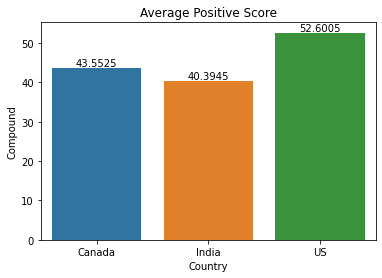

In [75]:
# use sns barplot to plot bar plot
# between Country and Sentiment value
ax = sns.barplot(x = x_pos.index, y = x_pos["Compound"],
                 data = x_pos)

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
ax.bar_label(ax.containers[0])

ax.set_title("Average Positive Score")


In [76]:
x_neg = negi.groupby("Country")[["Compound"]].mean()*100
x_neg

,Compound
Country,
Canada,-56.143333
India,-31.347500
US,-43.622105


Text(0.5, 1.0, 'Average Negative Score')

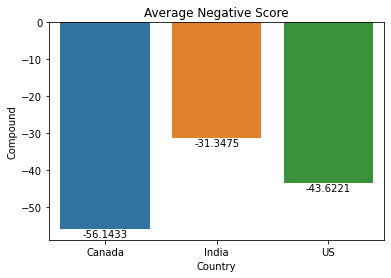

In [77]:
# use sns barplot to plot bar plot
# between Country and Sentiment value
ax = sns.barplot(x = x_neg.index, y = x_neg["Compound"],
                 data = x_neg)

# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
ax.bar_label(ax.containers[0])

ax.set_title("Average Negative Score")

In [78]:
df_all = df.groupby(["Country", "Opinion"])[["Opinion_Weight"]].count()
df_all

Opinion_Weight
Country Opinion                 
Canada  Negative               3
        Neutral                3
        Positive               8
India   Negative               4
        Neutral               11
        Positive              20
US      Negative              19
        Neutral               38
        Positive              63

Text(0.5, 1.0, 'Count of Opinions in different Country')

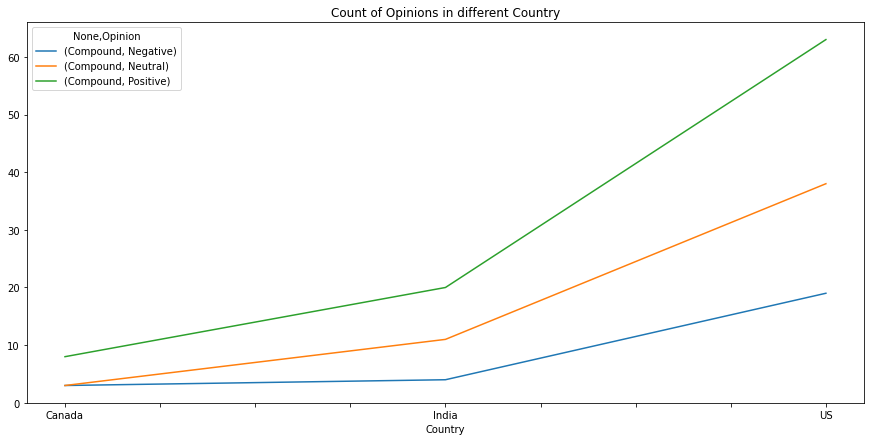

In [79]:
#ax = sns.barplot(x = df_all.index, y = df_all["Opinion_Weight"],
#                 data = df_all)
#ax.bar_label(ax.containers[0])

fig, ax = plt.subplots(figsize=(15,7))
df.groupby(["Country", "Opinion"])[["Compound"]].count().unstack().plot(ax=ax)


ax.set_title("Count of Opinions in different Country")

# Word Cloud

A word cloud (also known as a tag cloud) is a visual representation of words. 

Cloud creators are used to highlight popular words and phrases based on frequency and relevance. 

They provide you with quick and simple visual insights that can lead to more in-depth analyses.

In [80]:
from wordcloud import WordCloud 

# Positive Word Cloud

In [81]:
df['Lemma'] [df['Country']=='India']

134    research say plantbased diet best planet peopl...
135                vegan diet best weight loss diet plan
136    people traditional indian diet grain egg milk ...
137            diet last generation probably india start
138    troll trigger diet soda post diet soda lover v...
139    shirataki rice diet cooker konjac rice pack in...
140    coconut flour coconut atta paleo keto diet nat...
141    buyer saydiet vegan food supplement availableh...
142    celebrate teej hobbg herb highly nutrition foo...
143           analysis show plantbased diet least impact
144    vegan philippine plantbased diet spread countr...
145       wish vegan family issue blood sugar meat eater
146    best diet carnivore veganketo cico carb grandm...
147    diet vegan food supplement availablehurry disc...
148    type diet vegan food supplement availablehurry...
149    congress constitution state leader must resist...
150                                  anything vegan diet
151    sweetie vegan follow veg

# Positive WordCloud Country: India

In [82]:
all_words_positive = ' '.join(text for text in df['Lemma'][df['Country']=='India'][df['Compound'] > 0])

In [83]:
wc_positive = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_positive)

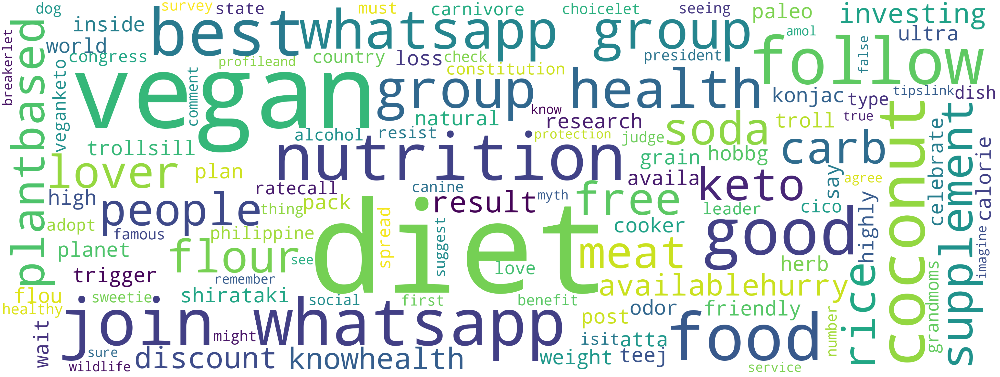

In [84]:
plt.figure(figsize=(70,70))
plt.imshow(wc_positive)
plt.axis('off')
#plt.title('Positive Wordcloud for Country India')
plt.show()

# Positive WordCloud Country: Canada

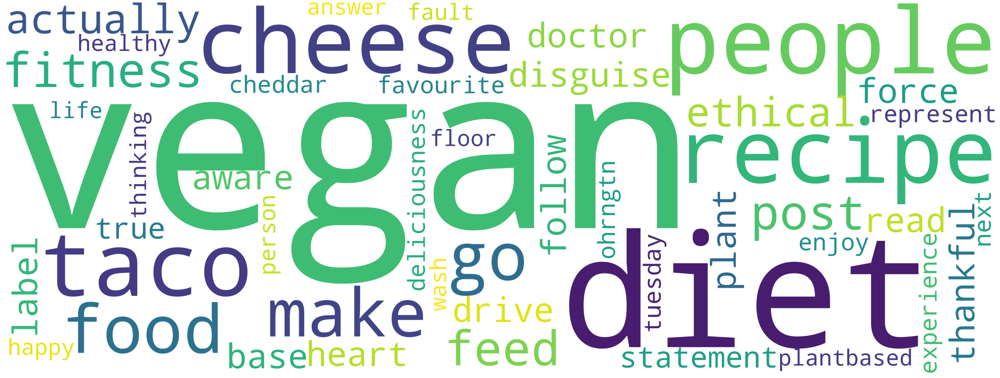

In [85]:
all_words_positive = ' '.join(text for text in df['Lemma'][df['Country']=='Canada'][df['Compound'] > 0])

wc_positive = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_positive)

plt.figure(figsize=(50,50))
plt.imshow(wc_positive)
plt.axis('off')
#plt.title('Positive Wordcloud for Country Canada')
plt.show()

# Positive WordCloud Country: US

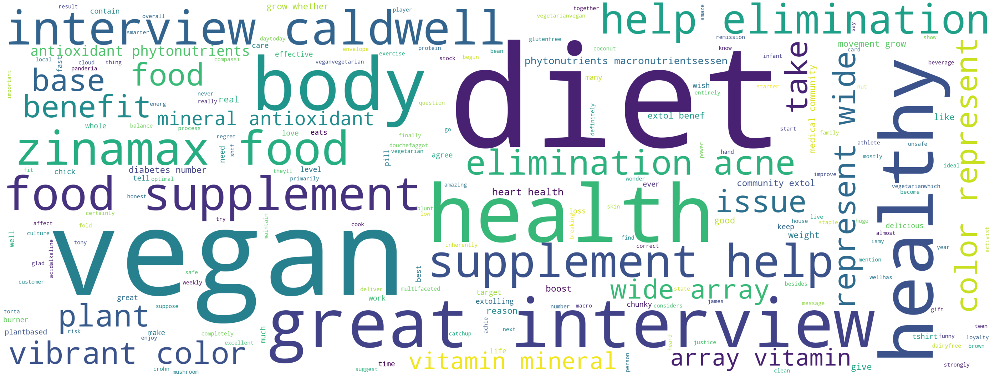

In [86]:
all_words_positive = ' '.join(text for text in df['Lemma'][df['Country']=='US'][df['Compound'] > 0])

wc_positive = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_positive)

plt.figure(figsize=(50,50))
plt.imshow(wc_positive)
plt.axis('off')
#plt.title('Positive Wordcloud for Country US')
plt.show()

# Negative Word Cloud

# Negative WordCloud Country: India

In [87]:
all_words_negative = ' '.join(text for text in df['Lemma'][df['Country']=='India'][df['Compound'] < 0]) 

In [88]:
wc_negative = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_negative)

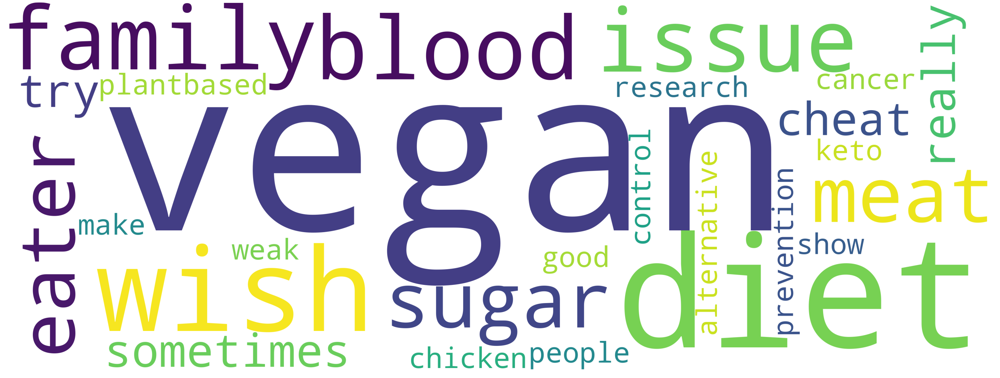

In [89]:
plt.figure(figsize=(50,50))
plt.imshow(wc_negative)
plt.axis('off')
#plt.title('Negative Wordcloud for Country India')
plt.show()

# Negative WordCloud Country: Canada

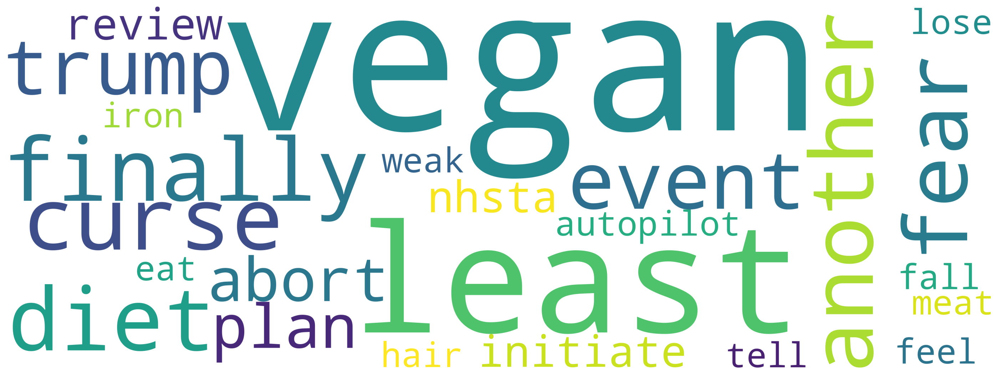

In [90]:
all_words_negative = ' '.join(text for text in df['Lemma'][df['Country']=='Canada'][df['Compound'] < 0]) 

wc_negative = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_negative)

plt.figure(figsize=(50,50))
plt.imshow(wc_negative)
plt.axis('off')
#plt.title('Negative Wordcloud for Country Canada')
plt.show()

# Negative WordCloud Country: US

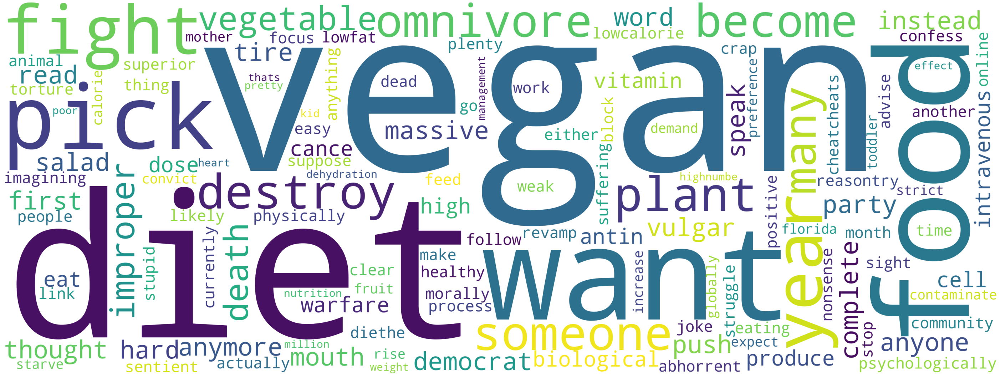

In [91]:
all_words_negative = ' '.join(text for text in df['Lemma'][df['Country']=='US'][df['Compound'] < 0]) 

wc_negative = WordCloud(stopwords = stop_word, background_color='white', height=1500, width=4000).generate(all_words_negative)

plt.figure(figsize=(50,50))
plt.imshow(wc_negative)
plt.axis('off')
#plt.title('Negative Wordcloud for Country US')
plt.show()

# TF - IDF (Term Frequency - Inverse Document Frequency)

# It is a method of extracting the features from the text data.


# Used to find related content and important words and phrase in a larger text.


# 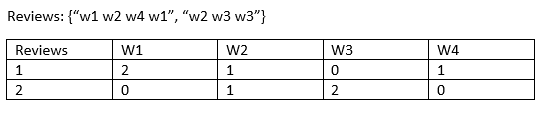

# ![TF](TF.png)

![IDF_sam](IDF_sam.png)

# Term Frequency - Words that are frequently occurring in a document(Word count)., how often does a word ‘w’ occur in a document ‘d’. 

# It is the ratio of the number of times the word appears in a document compared to the total number of words in that document.


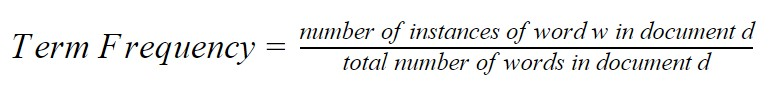

# Inverse Document Frequency

# Used to calculate the weight of rare words across all documents in the corpus.

# The words that occur rarely in the corpus have a high IDF score


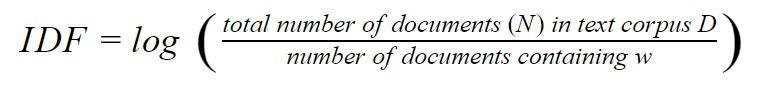

In [92]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

In [93]:
tw = df["Lemma"]

In [94]:
vectorizer = TfidfVectorizer()

In [95]:
Lemma = vectorizer.fit_transform(tw)

In [96]:
Lemma.shape

(169, 690)

In [97]:
df1 = pd.DataFrame(Lemma.todense(), columns=vectorizer.get_feature_names()) 
# todense() will return the matrix.

C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [98]:
df1

,abhorrent,abort,absoutely,accord,achie,acidalkaline,acne,activist,actually,adopt,advise,affect,agenda,aggression,agree,alcohol,almost,alternative,always,amaze,amazing,american,amol,analysis,animal,animalsif,another,answer,antin,antioxidant,anymore,anyone,anything,around,array,athlete,atta,attitude,autopilot,availa,availablehurry,average,aware,balance,barclay,base,bean,become,becomes,begin,bench,benef,benefit,besides,best,betacarotene,beverage,big,biological,black,block,blood,blunt,body,boost,boris,brainwash,brand,breakerlet,breaking,brown,burner,butcher,buyer,caldwell,calorie,camerons,cance,cancer,canine,carb,card,cardiologist,care,carnivore,cartoon,catchup,celebrate,cell,certainly,change,changer,cheat,cheatcheats,check,cheddar,cheese,chemical,chick,chicken,child,chili,choice,choicelet,chunky,cico,clean,clear,close,cloud,coconut,collaboration,color,come,comment,community,compassi,complete,completely,confess,congress,considers,constant,constitution,consume,consumer,consuming,contain,contains,contaminate,control,convict,cook,cooker,correct,country,couple,cow,cowspiracy,crap,creamy,crohn,culture,current,currently,curse,customer,dairy,dairyfree,dance,date,david,day,daytoday,dead,death,declare,definitely,dehydration,delicious,deliciousness,deliver,demand,democrat,dense,design,destroy,diabetes,diet,diethe,dietician,disco,discount,disguise,dish,doctor,documentary,dog,dose,douchefaggot,drive,earthling,easy,eat,eater,eating,eats,effect,effective,egg,either,elimination,else,embroider,endorse,energ,enjoy,entirely,envelope,esselstyn,ethical,even,evening,event,ever,every,everytime,excellent,exercise,exmembers,expect,expensive,experience,expert,explain,extol,extolling,extreme,fall,false,family,famous,farm,fast,fault,favorite,favourite,fear,feed,feel,fight,fill,finalist,finally,find,fine,finger,first,fit,fitness,flavorful,floor,florida,flou,flour,focus,fold,follow,food,force,fork,france,frederick,free,friend,friendly,front,fruit,fuel,full,funny,game,gap,gavaskar,generation,gift,give,glad,globally,gluten,glutenfree,go,good,gotten,governm,government,grain,grandmoms,great,group,grow,hair,halt,hand,happy,hard,health,healthy,heard,heart,heartstrong,help,herb,hidden,high,highly,highnumbe,historically,hobbg,hole,honest,house,huge,humanly,ideal,illustrate,imagine,imagining,impact,imply,important,improper,improve,includ,include,increase,india,indian,infant,inform,information,informs,ingredient,inherently,initiate,insect,inside,insist,instead,interview,intravenous,intuitive,investing,iron,isit,ismy,issue,italian,james,johnson,join,joke,judge,justice,keep,keto,kid,kind,knife,know,knowhealth,kohli,konjac,kyrgios,label,last,leader,learn,least,lemon,less,level,lick,life,lifestyle,like,likely,limited,link,list,liter,live,local,lomasi,longterm,look,lord,lose,loss,love,lover,low,lowcalorie,lowfat,loyalty,lucan,luck,macro,macronutrientsessen,maintain,make,makhani,making,management,many,maple,marker,massive,master,maybe,mcdonalds,meat,medical,medium,mental,mention,mequestioned,message,might,milk,milkmilk,million,mineral,month,morally,morning,mostly,mother,mouth,movement,much,multifaceted,mushroom,must,myth,natural,need,never,next,nhsta,nick,night,nonsense,nonwhite,nope,notice,nourishment,novak,nsect,number,nut,nutrient,nutrition,nutritional,ob,odor,offering,ohrngtn,omnivore,online,onlypeople,onto,optimal,option,organic,overall,pack,paleo,panderia,party,pass,peasant,people,pepper,person,philippine,physically,physician,phytonutrients,pick,pill,plan,planet,plant,plantbased,plantify,player,please,plenty,point,poor,positive,post,postbrexit,potential,power,powerful,preference,president,pretty,prevention,primarily,primary,prob,probably,process,produce,product,profileand,progress,promo,promote,protection,protein,prude,psychologically,pure,push,question,raise,ratecall,rather,read,ready,real,really,reason,reasontry,recently,recipe,regret,reliable,remember,remission,represent,repress,research,resist,result,revamp,reveal,review,rice,right,rise,risk,rocket,rohan,safe,sala

# Split the Dataset for TF-IDF DataFrame

In [99]:
from sklearn.model_selection import train_test_split

In [100]:
x_train, x_test, y_train, y_test = train_test_split(Lemma, df['Opinion_Weight'], 
                                                    test_size = 0.3, random_state = 7)

In [101]:
x_train.shape

(118, 690)

In [102]:
x_test.shape

(51, 690)

In [103]:
y_train.shape

(118,)

In [104]:
y_test.shape

(51,)

# SVC(Support Vector Machine)

In [105]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [106]:
svc_model = SVC()

In [107]:
svc_model.fit(x_train, y_train)

SVC()

In [108]:
svc_pred = svc_model.predict(x_test)

In [109]:
#svc_pred

In [110]:
svc_accuracy = accuracy_score(y_test, svc_pred) *100

In [111]:
svc_accuracy

66.66666666666666

In [112]:
#print("Confusion Matrix: \n", confusion_matrix(y_test, svc_pred))
#cm=confusion_matrix(y_test, svc_pred)

cm=confusion_matrix(y_true=y_test, y_pred=svc_pred)

Text(33.0, 0.5, 'Actual')

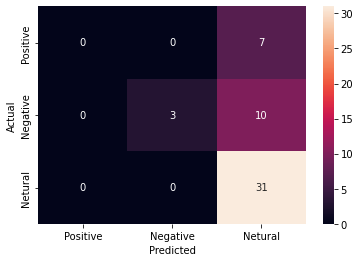

In [113]:
sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

# ![Confusion](Confusion.png)

In [114]:
print("Classification Report: \n\n", classification_report(y_test, svc_pred))


Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       1.00      0.23      0.38        13
         1.0       0.65      1.00      0.78        31

    accuracy                           0.67        51
   macro avg       0.55      0.41      0.39        51
weighted avg       0.65      0.67      0.57        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [115]:
# Precision: Positive Response : 67% of opinions that the model predicted.
#            Neutral Response: 100% of opinions that the model predicted.
#            Negative Response: 0% of opinions that the model predicted


# Recall: Positive Response: The model only predicted this outcome correctly for 100% of those opinions.
#         Neutral Response: The model only predicted this outcome correctly for 21% of those opinions.
#         Negative Response: The model only predicted this outcome correctly for 0% of those opinions.


# F1 Score: Positive Response: Since this value is very close to 1, it tells us that the model does a poor job of prediction.
#           Neutral Response: Since this value isn’t very close to 1, it tells us that the model does a poor job of prediction.
#           Negative Response: Since this value is 0, it tells us that the model does a poor job of prediction.

# KNN

In [116]:
from sklearn.neighbors import KNeighborsClassifier

In [117]:
knn = KNeighborsClassifier(n_neighbors = 10)

In [118]:
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [119]:
knn_pred = knn.predict(x_test)

In [120]:
#knn_pred

In [121]:
knn_accuracy = accuracy_score(y_test, knn_pred) *100

In [122]:
knn_accuracy

58.82352941176471

In [123]:
#print("Confusion Matrix: \n", confusion_matrix(y_test, knn_pred))
cm = confusion_matrix(y_test, knn_pred)

Text(33.0, 0.5, 'Actual')

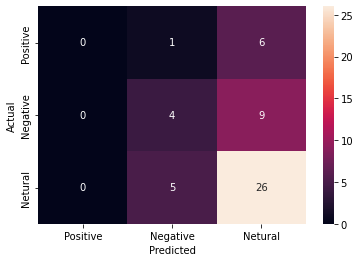

In [124]:
sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [125]:
print("Classification Report: \n\n", classification_report(y_test, knn_pred))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       0.40      0.31      0.35        13
         1.0       0.63      0.84      0.72        31

    accuracy                           0.59        51
   macro avg       0.34      0.38      0.36        51
weighted avg       0.49      0.59      0.53        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Random Forest

In [126]:
from sklearn.ensemble import RandomForestClassifier

In [127]:
rnd = RandomForestClassifier(n_estimators=100, max_leaf_nodes=16, random_state=50)
# n_estimators = the number of decision trees to use.

In [128]:
rnd

RandomForestClassifier(max_leaf_nodes=16, random_state=50)

In [129]:
rnd.fit(x_train, y_train)

RandomForestClassifier(max_leaf_nodes=16, random_state=50)

In [130]:
rnd_pred = rnd.predict(x_test)

In [131]:
#rnd_pred

In [132]:
rnd_accuracy = accuracy_score(y_test, rnd_pred) *100

In [133]:
rnd_accuracy

68.62745098039215

In [134]:
cm=confusion_matrix(y_true=y_test, y_pred=rnd_pred)

Text(33.0, 0.5, 'Actual')

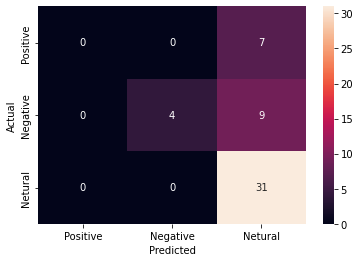

In [135]:
sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [136]:
print("Classification Report: \n\n", classification_report(y_test, rnd_pred))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       1.00      0.31      0.47        13
         1.0       0.66      1.00      0.79        31

    accuracy                           0.69        51
   macro avg       0.55      0.44      0.42        51
weighted avg       0.66      0.69      0.60        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Naive Bayes Classifier

In [137]:
from sklearn import model_selection, naive_bayes

In [138]:
Naive = naive_bayes.MultinomialNB()

In [139]:
Naive.fit(x_train, y_train)

MultinomialNB()

In [140]:
nb_pred = Naive.predict(x_test)

In [141]:
nb_accuracy = accuracy_score(nb_pred, y_test)*100

In [142]:
nb_accuracy

64.70588235294117

In [143]:
#print("Confusion Matrix: \n", confusion_matrix(y_test, knn_pred))
cm = confusion_matrix(y_true=y_test, y_pred=nb_pred)

Text(33.0, 0.5, 'Actual')

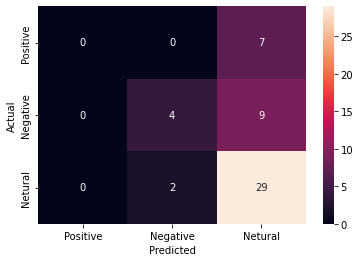

In [144]:
sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [145]:
print("Classification Report: \n\n", classification_report(y_test, rnd_pred))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       1.00      0.31      0.47        13
         1.0       0.66      1.00      0.79        31

    accuracy                           0.69        51
   macro avg       0.55      0.44      0.42        51
weighted avg       0.66      0.69      0.60        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Comparison of different models for TF-IDF

In [146]:
all_algo = ['SVC', 'KNN','Random Forest', 'Naive Bayes']

In [147]:
all_accuracy = [svc_accuracy, knn_accuracy, rnd_accuracy, nb_accuracy]

In [148]:
all_compare = pd.DataFrame({'Models' : all_algo, 'Accuracy' : all_accuracy}, index = [i for i in range(1, 5)])

In [149]:
all_compare.T

,1,2,3,4
Models,SVC,KNN,Random Forest,Naive Bayes
Accuracy,66.666667,58.823529,68.627451,64.705882


In [150]:
all_compare.style.bar(subset=['Accuracy'], color='#bfe8ae')

,Models,Accuracy
1,SVC,66.666667
2,KNN,58.823529
3,Random Forest,68.627451
4,Naive Bayes,64.705882


In [151]:
import seaborn as sns

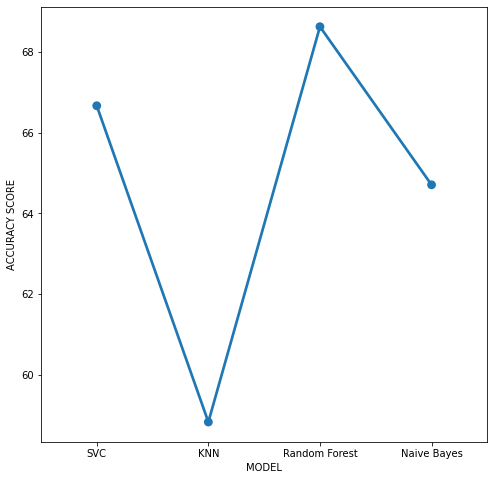

In [152]:
plt.figure(figsize = (8, 8))
sns.pointplot(x = all_compare["Models"], y = all_compare["Accuracy"], data = all_compare)
plt.xlabel('MODEL')
plt.ylabel('ACCURACY SCORE')
plt.show()

# Count Vectorizer

In [153]:
countVectorizer = CountVectorizer()

countVectorizer.fit(tw)

cvec_counts = countVectorizer.transform(tw)


In [154]:
df2 = pd.DataFrame(cvec_counts.todense(), columns=vectorizer.get_feature_names())
# todense() will return the matrix.
print(df2)

C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


     abhorrent  abort  absoutely  accord  achie  acidalkaline  acne  activist  \
0            0      0          0       0      0             0     0         0   
1            0      0          0       0      0             0     0         0   
2            0      0          0       0      0             0     0         0   
3            0      0          0       0      0             0     0         0   
4            0      0          0       0      0             0     0         0   
5            0      0          0       0      0             0     0         0   
6            0      0          0       0      0             0     0         0   
7            0      0          0       0      0             0     0         0   
8            0      0          0       0      0             0     0         0   
9            0      0          0       0      0             0     0         0   
10           0      1          0       0      0             0     0         0   
11           0      0       

# Split the Dataset for Count Vectorizer DataFrame

In [155]:
x_train_c, x_test_c, y_train_c, y_test_c = train_test_split(cvec_counts, df['Opinion_Weight'], 
                                                    test_size = 0.3, random_state = 7)

In [156]:
x_train_c.shape

(118, 690)

In [157]:
y_train_c.shape

(118,)

In [158]:
x_test_c.shape

(51, 690)

In [159]:
y_test_c.shape

(51,)

# KNN

In [160]:
knn = KNeighborsClassifier(n_neighbors = 10)

knn.fit(x_train_c, y_train_c)

knn_pred_c = knn.predict(x_test_c)

#knn_pred

knn_accuracy_c = accuracy_score(y_test_c, knn_pred_c) *100

knn_accuracy_c

50.98039215686274

Text(33.0, 0.5, 'Actual')

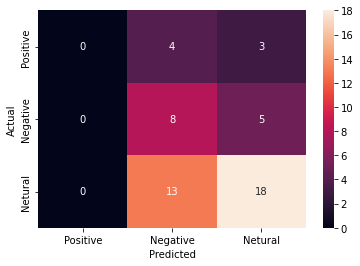

In [161]:
cm=confusion_matrix(y_true=y_test, y_pred=knn_pred_c)

sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [162]:
print("Classification Report: \n\n", classification_report(y_test, knn_pred_c))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       0.32      0.62      0.42        13
         1.0       0.69      0.58      0.63        31

    accuracy                           0.51        51
   macro avg       0.34      0.40      0.35        51
weighted avg       0.50      0.51      0.49        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# SVM

In [163]:
svc_model = SVC()

svc_model.fit(x_train_c, y_train_c)

svc_pred_c = svc_model.predict(x_test_c)

#svc_pred

svc_accuracy_c = accuracy_score(y_test_c, svc_pred_c) *100

svc_accuracy_c

68.62745098039215

Text(33.0, 0.5, 'Actual')

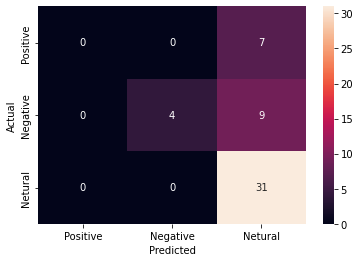

In [164]:
cm=confusion_matrix(y_true=y_test, y_pred=svc_pred_c)


sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [165]:
print("Classification Report: \n\n", classification_report(y_test, svc_pred_c))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       1.00      0.31      0.47        13
         1.0       0.66      1.00      0.79        31

    accuracy                           0.69        51
   macro avg       0.55      0.44      0.42        51
weighted avg       0.66      0.69      0.60        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Random Forest

In [166]:
rnd = RandomForestClassifier(n_estimators=100, max_leaf_nodes=16, random_state=50)
# n_estimatores = the number of decision trees to use.

rnd

rnd.fit(x_train_c, y_train_c)

rnd_pred_c = rnd.predict(x_test_c)

#rnd_pred

rnd_accuracy_c = accuracy_score(y_test_c, rnd_pred_c) *100

rnd_accuracy_c

64.70588235294117

Text(33.0, 0.5, 'Actual')

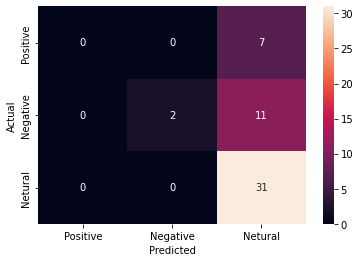

In [167]:
cm=confusion_matrix(y_true=y_test, y_pred=rnd_pred_c)


sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [168]:
print("Classification Report: \n\n", classification_report(y_test, rnd_pred_c))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00         7
         0.0       1.00      0.15      0.27        13
         1.0       0.63      1.00      0.78        31

    accuracy                           0.65        51
   macro avg       0.54      0.38      0.35        51
weighted avg       0.64      0.65      0.54        51



C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Neha\AppData\Roaming\Python\Python39\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Naive Bayes

In [169]:
Naive = naive_bayes.MultinomialNB()

Naive.fit(x_train_c, y_train_c)

nb_pred_c = Naive.predict(x_test_c)

nb_accuracy_c = accuracy_score(nb_pred_c, y_test_c)*100

nb_accuracy_c

62.745098039215684

Text(33.0, 0.5, 'Actual')

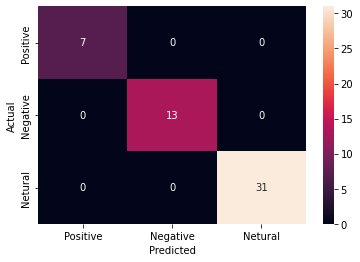

In [170]:
cm=confusion_matrix(y_true=y_test, y_pred=y_test_c)

sns.heatmap(cm, annot=True, xticklabels = ['Positive', 'Negative', 'Netural'], 
            yticklabels = ['Positive', 'Negative', 'Netural'])
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [171]:
print("Classification Report: \n\n", classification_report(y_test, y_test_c))

Classification Report: 

               precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00         7
         0.0       1.00      1.00      1.00        13
         1.0       1.00      1.00      1.00        31

    accuracy                           1.00        51
   macro avg       1.00      1.00      1.00        51
weighted avg       1.00      1.00      1.00        51



# Comparison of different models for CountVectorizer

In [172]:
all_algo_c = ['SVC', 'KNN','Random Forest', 'Naive Bayes']

all_accuracy_c = [svc_accuracy_c, knn_accuracy_c, rnd_accuracy_c, nb_accuracy_c]

all_compare_c = pd.DataFrame({'Models' : all_algo_c, 'Accuracy' : all_accuracy_c}, index = [i for i in range(1, 5)])

all_compare_c.T

all_compare_c.style.bar(subset=['Accuracy'], color='#bfe8ae')

,Models,Accuracy
1,SVC,68.627451
2,KNN,50.980392
3,Random Forest,64.705882
4,Naive Bayes,62.745098


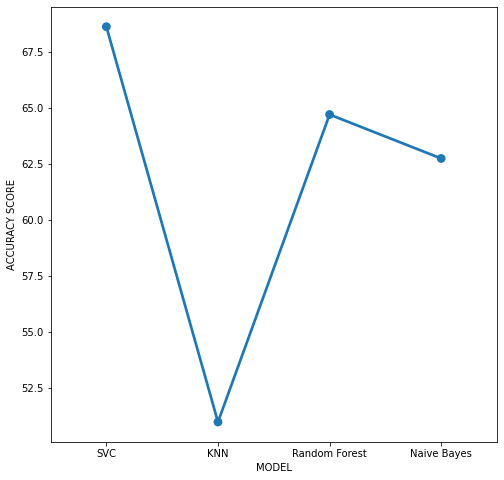

In [173]:
plt.figure(figsize = (8, 8))
sns.pointplot(x = all_compare_c["Models"], y = all_compare_c["Accuracy"], data = all_compare)
plt.xlabel('MODEL')
plt.ylabel('ACCURACY SCORE')
plt.show()

# Comaprison of TF-IDF and CountVector

In [174]:
all_algo = ['SVC', 'KNN','Random Forest', 'Naive Bayes']

all_accuracy = [svc_accuracy, knn_accuracy, rnd_accuracy, nb_accuracy]
all_accuracy_c = [svc_accuracy_c, knn_accuracy_c, rnd_accuracy_c, nb_accuracy_c]

In [175]:
all_compare = pd.DataFrame({'Models' : all_algo, 'TF-IDF Accuracy' : all_accuracy, 
                            'Count Vectorizer Accuracy' : all_accuracy_c},
                           index = [i for i in range(1, 5)])

all_compare

,Models,TF-IDF Accuracy,Count Vectorizer Accuracy
1,SVC,66.666667,68.627451
2,KNN,58.823529,50.980392
3,Random Forest,68.627451,64.705882
4,Naive Bayes,64.705882,62.745098


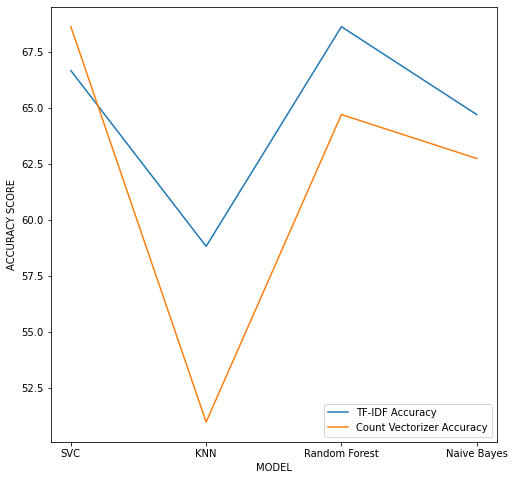

In [176]:
plt.figure(figsize = (8, 8))
plt.plot(all_compare["Models"], all_compare["TF-IDF Accuracy"],label='TF-IDF Accuracy')
plt.plot(all_compare["Models"], all_compare["Count Vectorizer Accuracy"],label='Count Vectorizer Accuracy')
plt.xlabel('MODEL')
plt.ylabel('ACCURACY SCORE')
plt.legend()
plt.show()